In [1]:
ptm = Sys.time()

library(CellChat)
library(patchwork)
options(stringsAsFactors = FALSE)

Loading required package: dplyr


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


Loading required package: igraph


Attaching package: ‘igraph’


The following objects are masked from ‘package:dplyr’:

    as_data_frame, groups, union


The following objects are masked from ‘package:stats’:

    decompose, spectrum


The following object is masked from ‘package:base’:

    union


Loading required package: ggplot2



In [2]:
library(data.table)
library(Matrix)


Attaching package: ‘data.table’


The following objects are masked from ‘package:dplyr’:

    between, first, last




In [3]:
# xenium = readRDS("/data/estorrs/mushroom/data/projects/submission_v1/HT413C1-Th1k4A1/cellchat/results.rds")
xenium = readRDS("/data/estorrs/mushroom/data/projects/submission_v1/HT206B1/cellchat/results.rds")
xenium

An object of class CellChat created from a single dataset 
 377 genes.
 649867 cells. 
CellChat analysis of spatial data! The input spatial locations are 
                      x_cent y_cent
HT206B1-U1_aaaclnhj-1   1441    844
HT206B1-U1_aaagfbeg-1   1327    851
HT206B1-U1_aaamcmll-1   1655    193
HT206B1-U1_aaamgegl-1   1256    861
HT206B1-U1_aaaobddd-1   1670    300
HT206B1-U1_aabhoeff-1   1648    215

In [4]:
# cosmx = readRDS("/data/estorrs/mushroom/data/projects/submission_v1/HT413C1-Th1k4A1/cellchat_cosmx/results.rds")
# cosmx

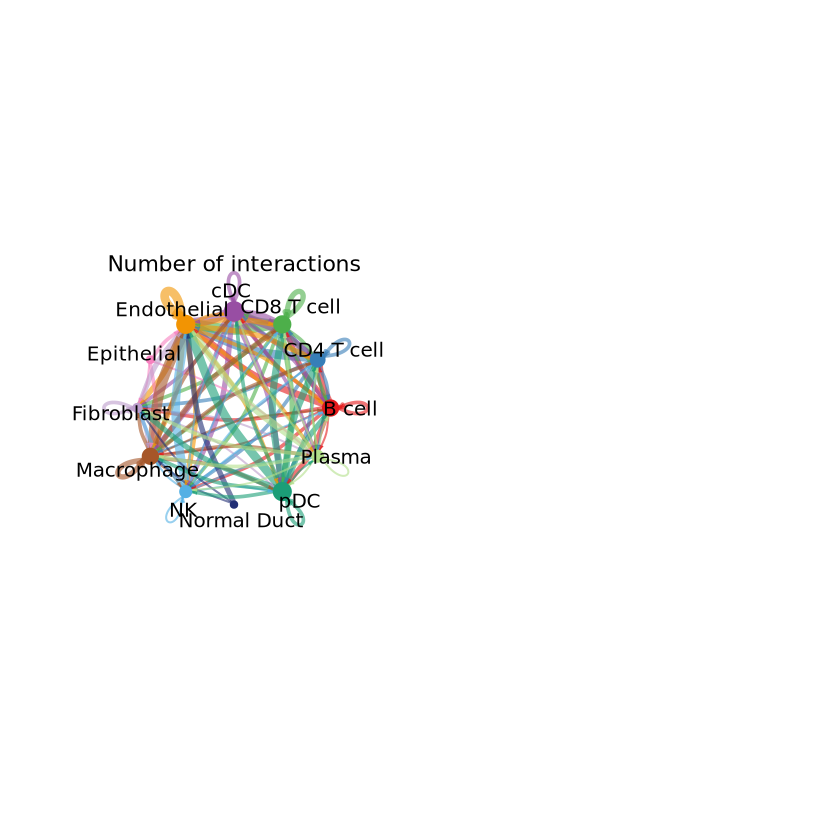

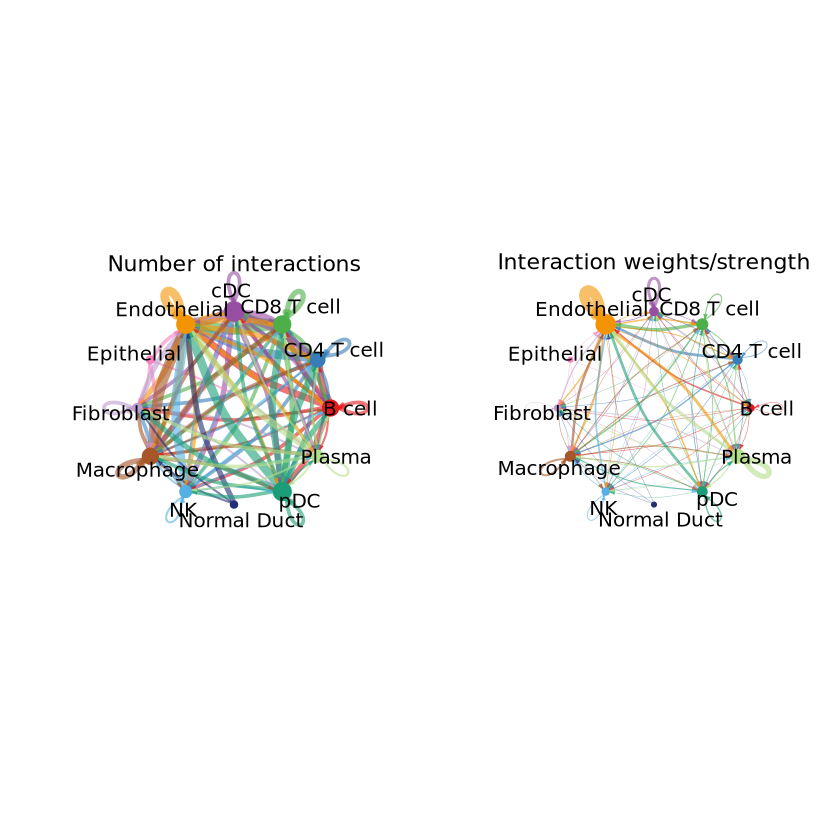

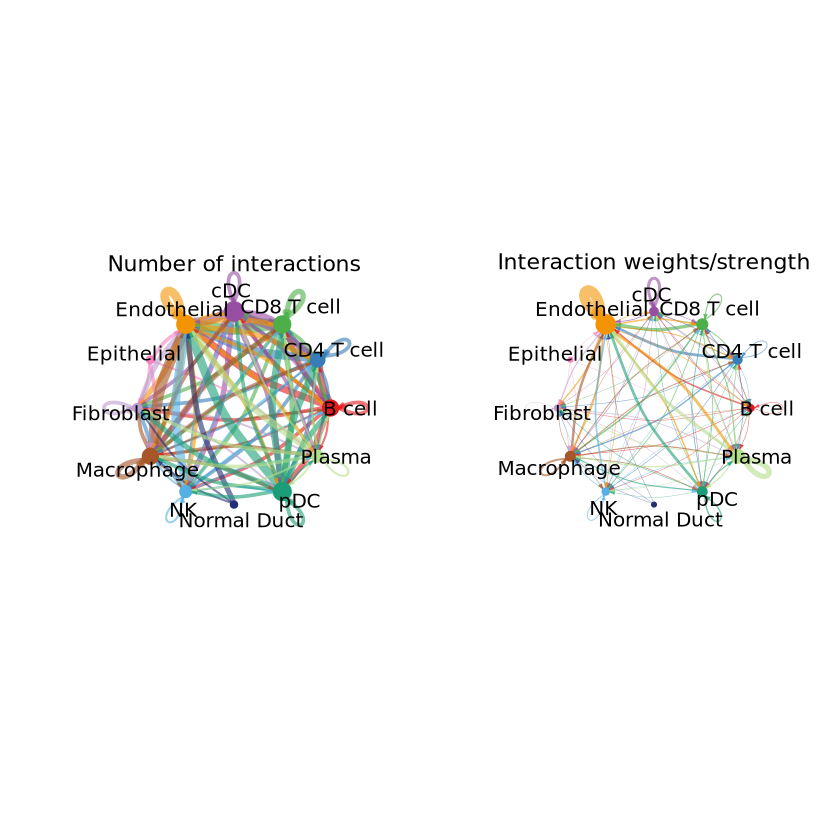

In [5]:
groupSize <- as.numeric(table(xenium@idents))
par(mfrow = c(1,2), xpd=TRUE)
netVisual_circle(xenium@net$count, vertex.weight = rowSums(xenium@net$count), weight.scale = T, label.edge= F, title.name = "Number of interactions")
netVisual_circle(xenium@net$weight, vertex.weight = rowSums(xenium@net$weight), weight.scale = T, label.edge= F, title.name = "Interaction weights/strength")

In [6]:
# groupSize <- as.numeric(table(cosmx@idents))
# par(mfrow = c(1,2), xpd=TRUE)
# netVisual_circle(cosmx@net$count, vertex.weight = rowSums(cosmx@net$count), weight.scale = T, label.edge= F, title.name = "Number of interactions")
# netVisual_circle(cosmx@net$weight, vertex.weight = rowSums(cosmx@net$weight), weight.scale = T, label.edge= F, title.name = "Interaction weights/strength")

In [7]:
netVisual_heatmap(xenium, measure = "weight", color.heatmap = "Blues", cluster.rows=T, cluster.cols=T)

Do heatmap based on a single object 


ERROR while rich displaying an object: Error in hclust(get_dist(t(submat), distance), method = method): NA/NaN/Inf in foreign function call (arg 10)

Traceback:
1. tryCatch(withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr)
 . }, error = error_handler), error = outer_handler)
2. tryCatchList(expr, classes, parentenv, handlers)
3. tryCatchOne(expr, names, parentenv, handlers[[1L]])
4. doTryCatch(return(expr), name, parentenv, handler)
5. withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr)
 . }, error = error_h

In [8]:
# netVisual_heatmap(cosmx, measure = "weight", color.heatmap = "Blues", cluster.rows=T, cluster.cols=T)

In [9]:
df.net <- subsetCommunication(xenium)
head(df.net)

,source,target,ligand,receptor,prob,pval,interaction_name,interaction_name_2,pathway_name,annotation,evidence
,<fct>,<fct>,<chr>,<chr>,<dbl>,<dbl>,<fct>,<chr>,<chr>,<chr>,<chr>
1,B cell,B cell,CCL19,CCR7,3.789039e-05,0,CCL19_CCR7,CCL19 - CCR7,CCL,Secreted Signaling,KEGG: hsa04060
2,CD4 T cell,B cell,CCL19,CCR7,1.056579e-05,0,CCL19_CCR7,CCL19 - CCR7,CCL,Secreted Signaling,KEGG: hsa04060
3,CD8 T cell,B cell,CCL19,CCR7,2.653432e-06,0,CCL19_CCR7,CCL19 - CCR7,CCL,Secreted Signaling,KEGG: hsa04060
4,cDC,B cell,CCL19,CCR7,2.779462e-05,0,CCL19_CCR7,CCL19 - CCR7,CCL,Secreted Signaling,KEGG: hsa04060
5,Endothelial,B cell,CCL19,CCR7,4.990868e-06,0,CCL19_CCR7,CCL19 - CCR7,CCL,Secreted Signaling,KEGG: hsa04060
6,pDC,B cell,CCL19,CCR7,5.967505e-07,0,CCL19_CCR7,CCL19 - CCR7,CCL,Secreted Signaling,KEGG: hsa04060


In [10]:
unique(df.net$interaction_name)

[1] CCL19_CCR7    CCL5_ACKR1    CXCL2_ACKR1   CXCL9_ACKR1   CXCL10_ACKR1 
 [6] EDN1_EDNRB    PTPRC_MRC1    CD86_CD28     CD86_CTLA4    CLEC2C_KLRB1 
[11] PECAM1_PECAM1 SELL_CD34    
16 Levels: CCL27_CCR2 CCL19_CCR7 CCL5_ACKR1 CXCL2_ACKR1 ... SELL_CD34

In [11]:
unique(df.net$pathway_name)

[1] "CCL"    "CXCL"   "EDN"    "CD45"   "CD86"   "CLEC"   "PECAM1" "SELL"

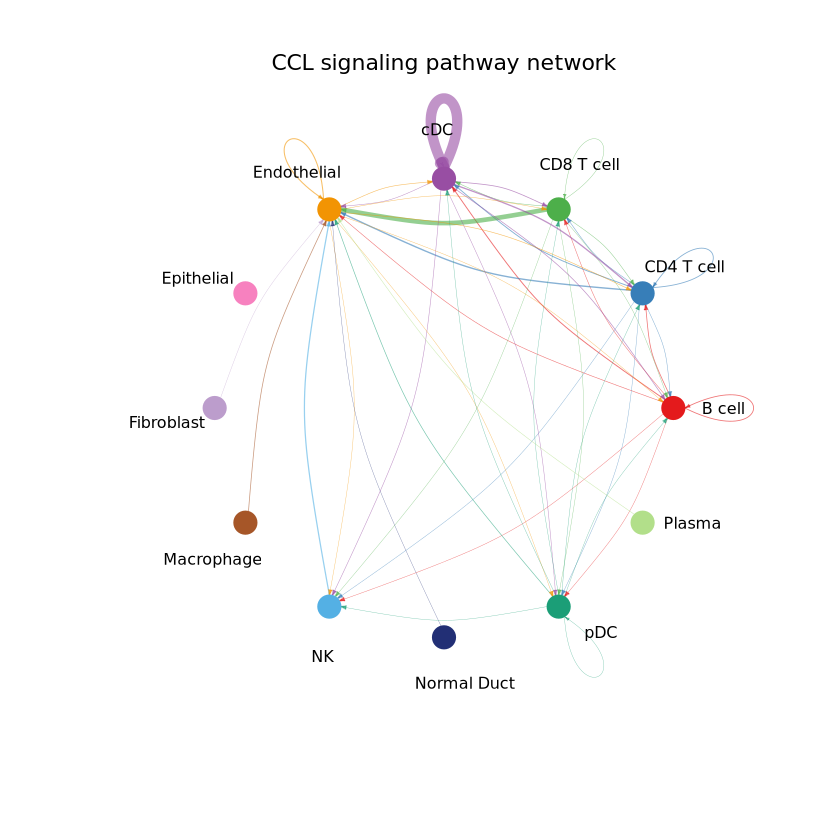

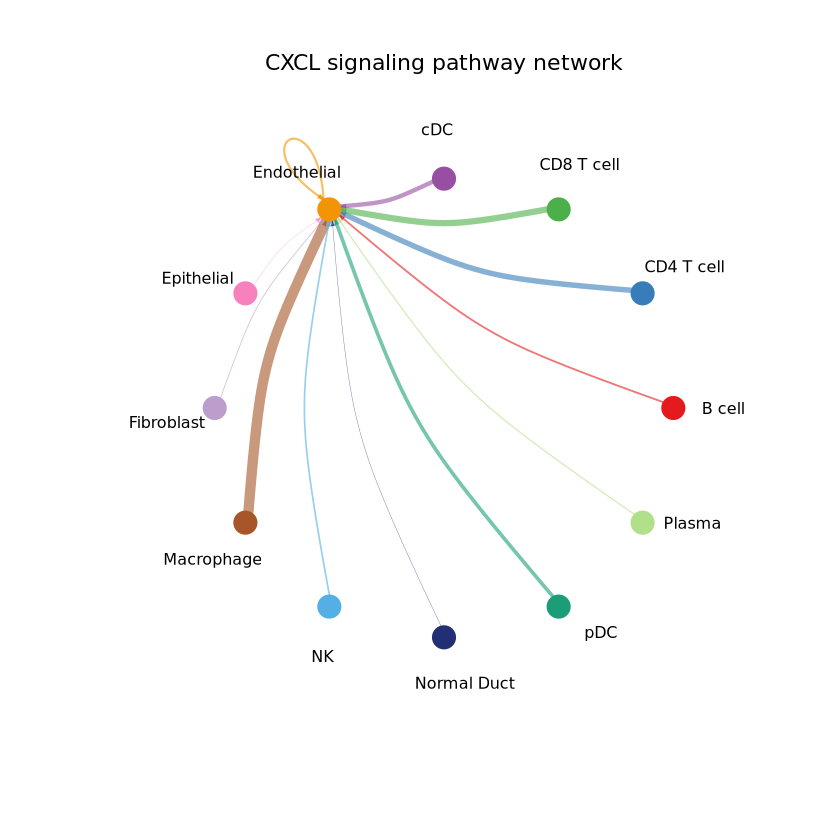

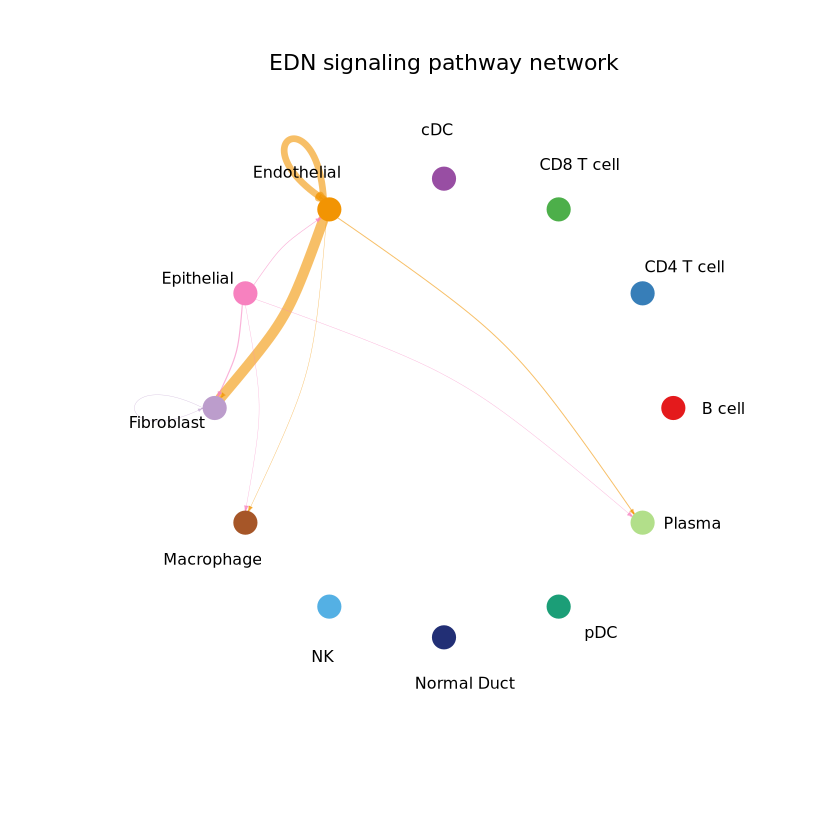

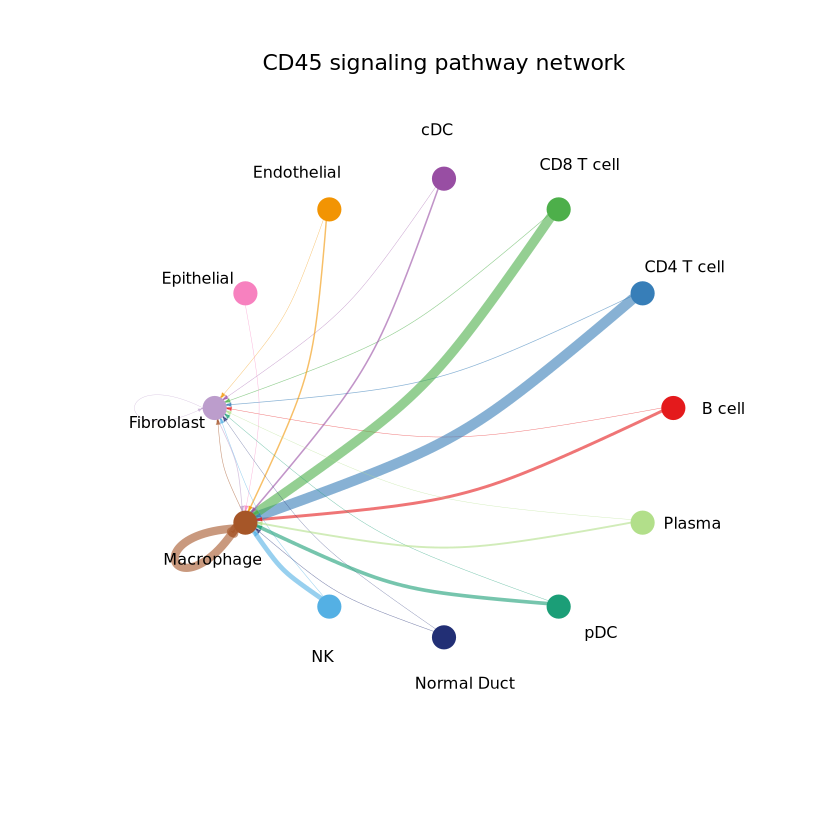

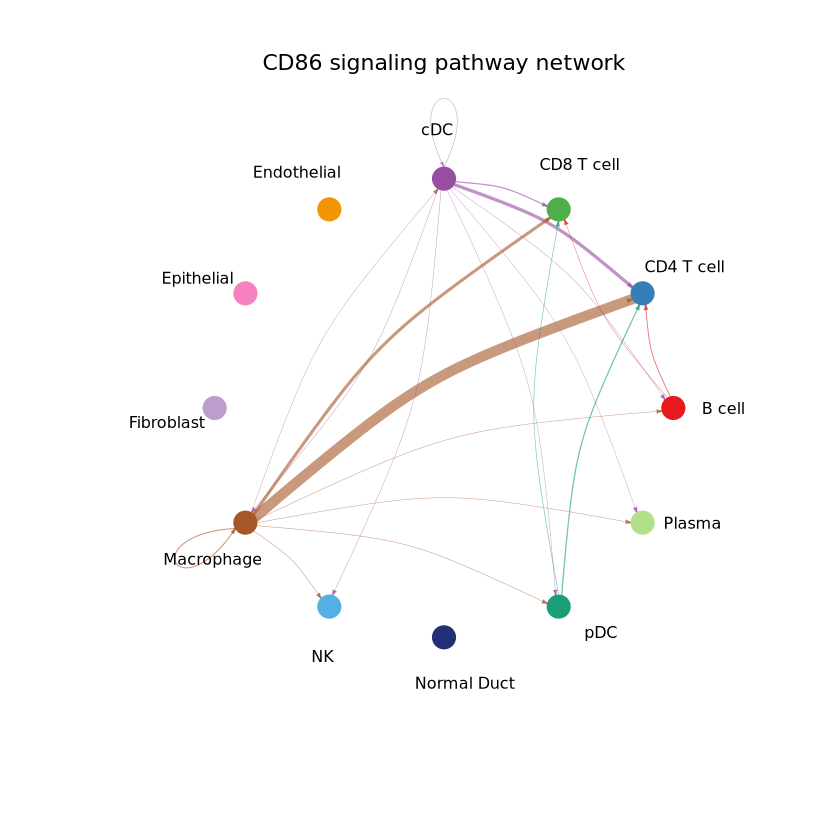

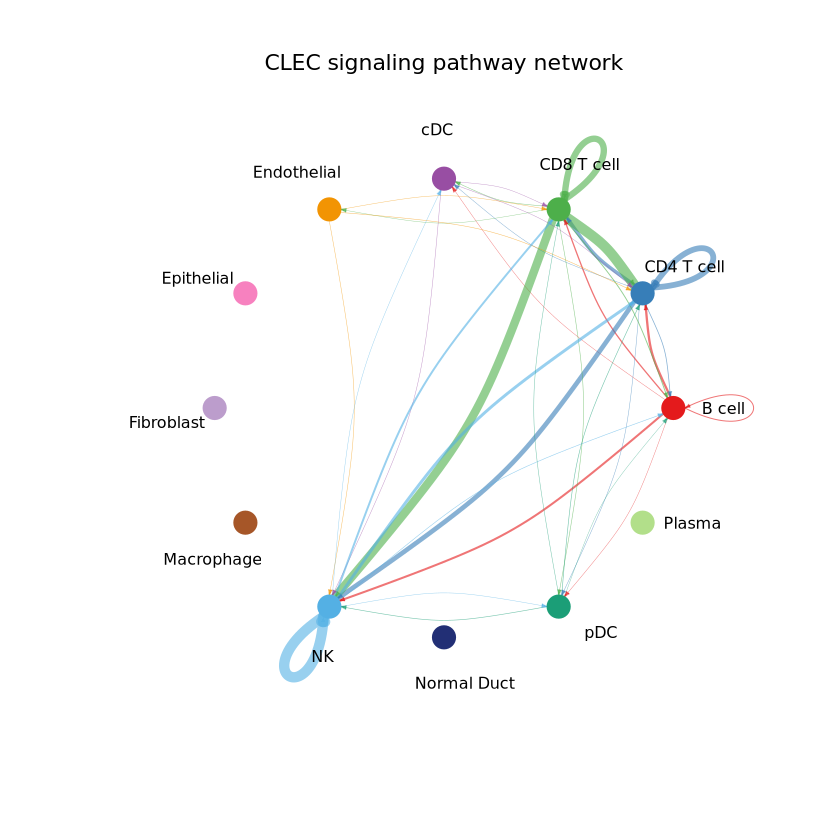

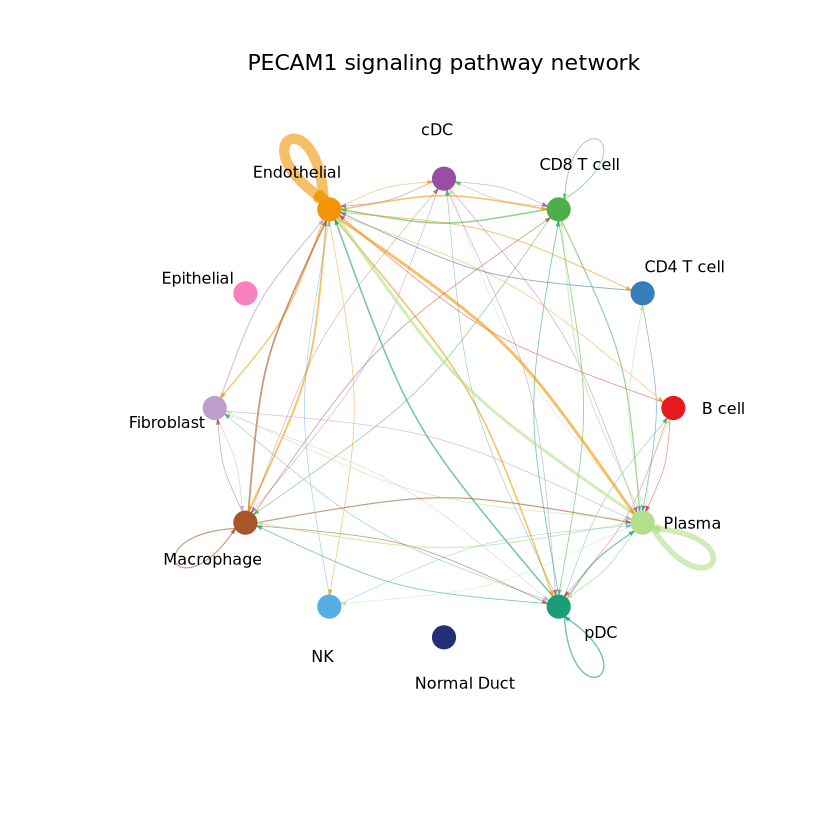

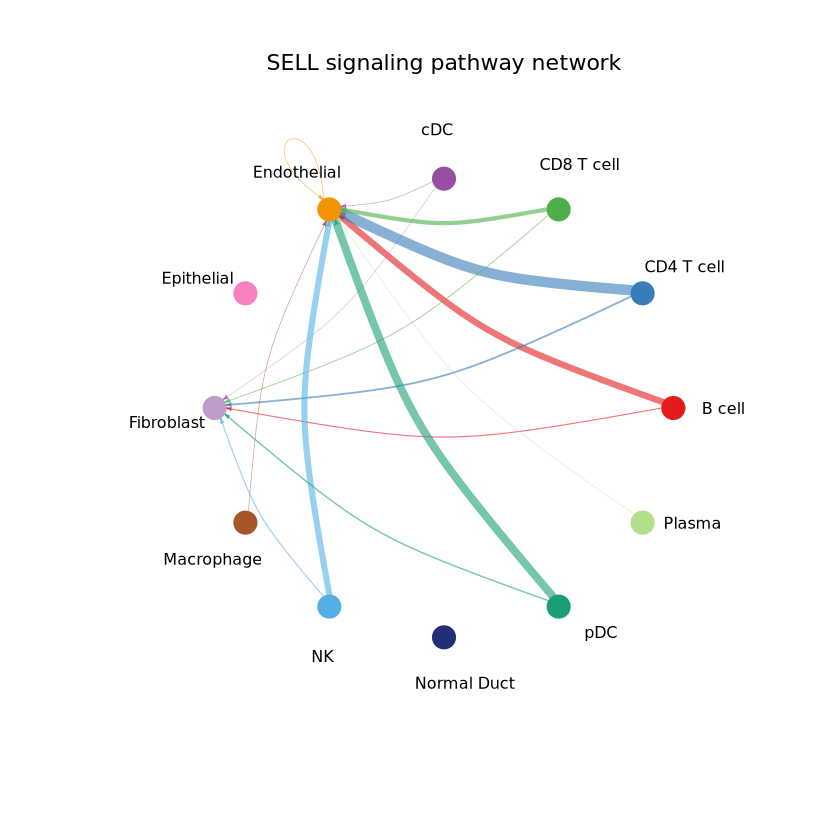

In [12]:
for (pathway in unique(df.net$pathway_name)) {
    par(mfrow=c(1,1), xpd = TRUE) # `xpd = TRUE` should be added to show the title
    netVisual_aggregate(xenium, signaling = c(pathway), layout = "circle")
}


In [13]:
pdf(file = "/data/estorrs/sandbox/fn1.pdf")
par(mfrow=c(1,1), xpd = TRUE) # `xpd = TRUE` should be added to show the title
p = netVisual_aggregate(xenium, signaling = c("FN1"), layout = "circle")
dev.off()

png 
  2

In [14]:
pdf(file = "/data/estorrs/sandbox/fn1_heatmap.pdf")
netAnalysis_signalingRole_network(xenium, signaling = c("FN1"), width = 8, height = 2.5, font.size = 10)
dev.off()

png 
  2

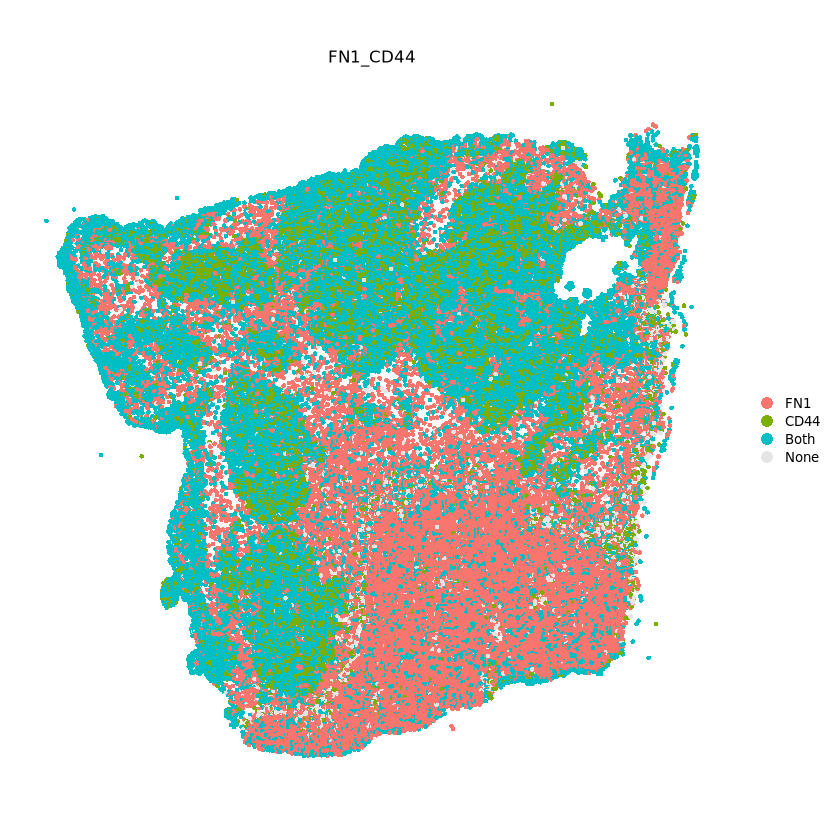

In [15]:
spatialFeaturePlot(xenium, pairLR.use = "FN1_CD44", point.size = 1, do.binary = TRUE, cutoff = 0.05, enriched.only = F, color.heatmap = "Reds", direction = 1, sample.use = "HT413C1-Th1k4A1-U9")





In [16]:
unique(xenium@meta$samples)

[1] HT413C1-Th1k4A1-U19 HT413C1-Th1k4A1-U2  HT413C1-Th1k4A1-U9 
[4] HT413C1-Th1k4A1-U25 HT413C1-Th1k4A1-U36
5 Levels: HT413C1-Th1k4A1-U19 HT413C1-Th1k4A1-U2 ... HT413C1-Th1k4A1-U9

In [17]:
df.net <- subsetCommunication(cosmx)
head(df.net)

,source,target,ligand,receptor,prob,pval,interaction_name,interaction_name_2,pathway_name,annotation,evidence
,<fct>,<fct>,<chr>,<chr>,<dbl>,<dbl>,<fct>,<chr>,<chr>,<chr>,<chr>
1,Cholangiocyte,Cholangiocyte,TGFB1,TGFbR1_R2,1.337341e-06,0.00,TGFB1_TGFBR1_TGFBR2,TGFB1 - (TGFBR1+TGFBR2),TGFb,Secreted Signaling,KEGG: hsa04350
2,Endothelial,Cholangiocyte,TGFB1,TGFbR1_R2,1.173267e-06,0.00,TGFB1_TGFBR1_TGFBR2,TGFB1 - (TGFBR1+TGFBR2),TGFb,Secreted Signaling,KEGG: hsa04350
3,Epithelial,Cholangiocyte,TGFB1,TGFbR1_R2,1.082107e-08,0.02,TGFB1_TGFBR1_TGFBR2,TGFB1 - (TGFBR1+TGFBR2),TGFb,Secreted Signaling,KEGG: hsa04350
4,Fibroblast,Cholangiocyte,TGFB1,TGFbR1_R2,5.901179e-07,0.00,TGFB1_TGFBR1_TGFBR2,TGFB1 - (TGFBR1+TGFBR2),TGFb,Secreted Signaling,KEGG: hsa04350
5,Macrophage,Cholangiocyte,TGFB1,TGFbR1_R2,3.570740e-07,0.00,TGFB1_TGFBR1_TGFBR2,TGFB1 - (TGFBR1+TGFBR2),TGFb,Secreted Signaling,KEGG: hsa04350
6,Plasma,Cholangiocyte,TGFB1,TGFbR1_R2,1.800161e-08,0.03,TGFB1_TGFBR1_TGFBR2,TGFB1 - (TGFBR1+TGFBR2),TGFb,Secreted Signaling,KEGG: hsa04350


In [18]:
unique(df.net$interaction_name)

[1] TGFB1_TGFBR1_TGFBR2   TGFB2_TGFBR1_TGFBR2   TGFB3_TGFBR1_TGFBR2  
  [4] TGFB1_ACVR1B_TGFBR2   TGFB2_ACVR1B_TGFBR2   TGFB3_ACVR1B_TGFBR2  
  [7] TGFB1_ACVR1_TGFBR1    TGFB2_ACVR1_TGFBR1    TGFB3_ACVR1_TGFBR1   
 [10] BMP2_BMPR1A_ACVR2A    BMP2_BMPR1A_BMPR2     BMP4_BMPR1A_ACVR2A   
 [13] BMP4_BMPR1A_BMPR2     BMP7_ACVR1_ACVR2A     BMP7_ACVR1_BMPR2     
 [16] BMP7_BMPR1A_ACVR2A    BMP7_BMPR1A_BMPR2     GDF15_TGFBR2         
 [19] INHBA_ACVR1B_ACVR2A   INHBB_ACVR1B_ACVR2A   INHBABB_ACVR1B_ACVR2A
 [22] INHABA_ACVR2A         WNT5A_FZD1            WNT5A_FZD3           
 [25] WNT5A_FZD4            WNT5A_FZD5            WNT5A_FZD6           
 [28] WNT5A_FZD7            WNT5A_FZD8            WNT5B_FZD1           
 [31] WNT5B_FZD3            WNT5B_FZD4            WNT5B_FZD5           
 [34] WNT5B_FZD6            WNT5B_FZD7            WNT5B_FZD8           
 [37] WNT11_FZD1            WNT11_FZD3            WNT11_FZD4           
 [40] WNT11_FZD5            WNT11_FZD6            WNT11_FZD7           
 [43] WNT11_FZD8            EGF_EGFR              EGF_EGFR_ERBB2       
 [46] AREG_EGFR             AREG_EGFR_ERBB2       FGF1_FGFR1           
 [49] FGF1_FGFR2            FGF1_FGFR3            FGF2_FGFR1           
 [52] FGF2_FGFR2            FGF2_FGFR3            FGF18_FGFR1          
 [55] FGF18_FGFR2           FGF18_FGFR3           FGF9_FGFR1           
 [58] FGF9_FGFR2            FGF9_FGFR3            PDGFA_PDGFRA         
 [61] PDGFA_PDGFRB          PDGFB_PDGFRA          PDGFB_PDGFRB         
 [64] PDGFC_PDGFRA          VEGFA_VEGFR1          VEGFA_VEGFR2         
 [67] VEGFB_VEGFR1          VEGFC_VEGFR2          PGF_VEGFR1           
 [70] VEGFA_VEGFR1R2        IGF2_IGF2R            IGF1_ITGA6_ITGB4     
 [73] IGF2_ITGA6_ITGB4      INS_INSSR             CCL5_CCR1            
 [76] CCL8_CCR1             CCL15_CCR1            CCL8_CCR2            
 [79] CCL2_CCR2             CCL5_CCR5             CCL19_CCR7           
 [82] CCL21_CCR7            CCL19_ACKR4           CCL21_ACKR4          
 [85] CCL28_CCR10           CCL8_ACKR4            CCL2_ACKR1           
 [88] CCL5_ACKR1            CCL8_ACKR1            CCL18_ACKR1          
 [91] CXCL5_ACKR1           CXCL8_ACKR1           CXCL9_ACKR1          
 [94] CXCL10_ACKR1          CXCL13_ACKR1          CCL11_ACKR1          
 [97] CCL17_ACKR1           CXCL5_CXCR1           CXCL8_CXCR1          
[100] CXCL5_CXCR2           CXCL8_CXCR2           CXCL9_CXCR3          
[103] CXCL10_CXCR3          CXCL13_CXCR3          CXCL12_CXCR4         
[106] CXCL12_ACKR3          CXCL13_CXCR5          CXCL16_CXCR6         
[109] MIF_CD74_CXCR4        MIF_CD74_CD44         MIF_CD74_CXCR2       
[112] MIF_ACKR3             CX3CL1_CX3CR1         IL7_IL7R_IL2RG       
[115] CSF2_CSF2RA_CSF2RB    IL6_IL6R_IL6ST        IL11_IL11RA_IL6ST    
[118] OSM_OSMR_IL6ST        IL1A_IL1R1_IL1RAP     IL1B_IL1R1_IL1RAP    
[121] IL1A_IL1R2            IL1B_IL1R2            IL17B_IL17RB         
[124] IL34_CSF1R            CSF1_CSF1R            IL16_CD4             
[127] TNFSF14_LTBR          TNFSF14_TNFRSF14      FASL_FAS             
[130] KLK3_NGFR             TNFSF12_TNFRSF12A     CD70_CD27            
[133] TNFSF9_TNFRSF9        TNFSF4_TNFRSF4        TNFSF13B_TNFRSF17    
[136] SPP1_CD44             SPP1_ITGAV_ITGB1      SPP1_ITGAV_ITGB5     
[139] SPP1_ITGA9_ITGB1      SPP1_ITGA8_ITGB1      SPP1_ITGA5_ITGB1     
[142] ANGPTL1_ITGA1_ITGB1   ANGPT2_TEK            ANGPT2_ITGA5_ITGB1   
[145] NPPC_NPR2             HGF_MET               ANXA1_FPR1           
[148] GAS6_AXL              GAS6_MERTK            LGALS9_CD45          
[151] RARRES2_CMKLR1        LGALS9_CD44           COL1A1_ITGA1_ITGB1   
[154] COL1A2_ITGA1_ITGB1    COL4A1_ITGA1_ITGB1    COL4A2_ITGA1_ITGB1   
[157] COL6A1_ITGA1_ITGB1    COL6A2_ITGA1_ITGB1    COL6A3_ITGA1_ITGB1   
[160] COL9A2_ITGA1_ITGB1    COL9A3_ITGA1_ITGB1    COL1A1_ITGA2_ITGB1   
[163] COL1A2_ITGA2_ITGB1    COL4A1_ITGA2_ITGB1    COL4A2_ITGA2_ITGB1   
[166] COL6A1_ITGA2_ITGB1    COL6A2_ITGA2_I

In [19]:
unique(df.net$pathway_name)

[1] "TGFb"     "BMP"      "GDF"      "ACTIVIN"  "ncWNT"    "EGF"     
 [7] "FGF"      "PDGF"     "VEGF"     "IGF"      "INSULIN"  "CCL"     
[13] "CXCL"     "MIF"      "CX3C"     "IL2"      "IL4"      "IL6"     
[19] "OSM"      "IL1"      "IL17"     "CSF"      "IL16"     "LIGHT"   
[25] "FASLG"    "NGF"      "TWEAK"    "CD70"     "CD137"    "OX40"    
[31] "BAFF"     "SPP1"     "ANGPTL"   "ANGPT"    "NPR2"     "HGF"     
[37] "ANNEXIN"  "GAS"      "GALECTIN" "CHEMERIN" "COLLAGEN" "FN1"     
[43] "LAMININ"  "THBS"     "VTN"      "APP"      "CD45"     "CD80"    
[49] "CDH"      "CDH1"     "CDH5"     "CEACAM"   "CSPG4"    "EPHA"    
[55] "EPHB"     "ESAM"     "ICAM"     "ICOS"     "NCAM"     "NOTCH"   
[61] "PD-L1"    "PECAM1"   "VCAM"     "ADGRE"    "ADGRG"    "ADGRL"   
[67] "PECAM2"

In [138]:
sort(unique(df.net$pathway_name))

[1] "ACTIVIN"  "ADGRE"    "ADGRG"    "ADGRL"    "ANGPT"    "ANGPTL"  
 [7] "ANNEXIN"  "APP"      "BAFF"     "BMP"      "CCL"      "CD137"   
[13] "CD45"     "CD70"     "CD80"     "CDH"      "CDH1"     "CDH5"    
[19] "CEACAM"   "CHEMERIN" "COLLAGEN" "CSF"      "CSPG4"    "CX3C"    
[25] "CXCL"     "EGF"      "EPHA"     "EPHB"     "ESAM"     "FASLG"   
[31] "FGF"      "FN1"      "GALECTIN" "GAS"      "GDF"      "HGF"     
[37] "ICAM"     "ICOS"     "IGF"      "IL1"      "IL16"     "IL17"    
[43] "IL2"      "IL4"      "IL6"      "INSULIN"  "LAMININ"  "LIGHT"   
[49] "MIF"      "NCAM"     "ncWNT"    "NGF"      "NOTCH"    "NPR2"    
[55] "OSM"      "OX40"     "PD-L1"    "PDGF"     "PECAM1"   "PECAM2"  
[61] "SPP1"     "TGFb"     "THBS"     "TWEAK"    "VCAM"     "VEGF"    
[67] "VTN"

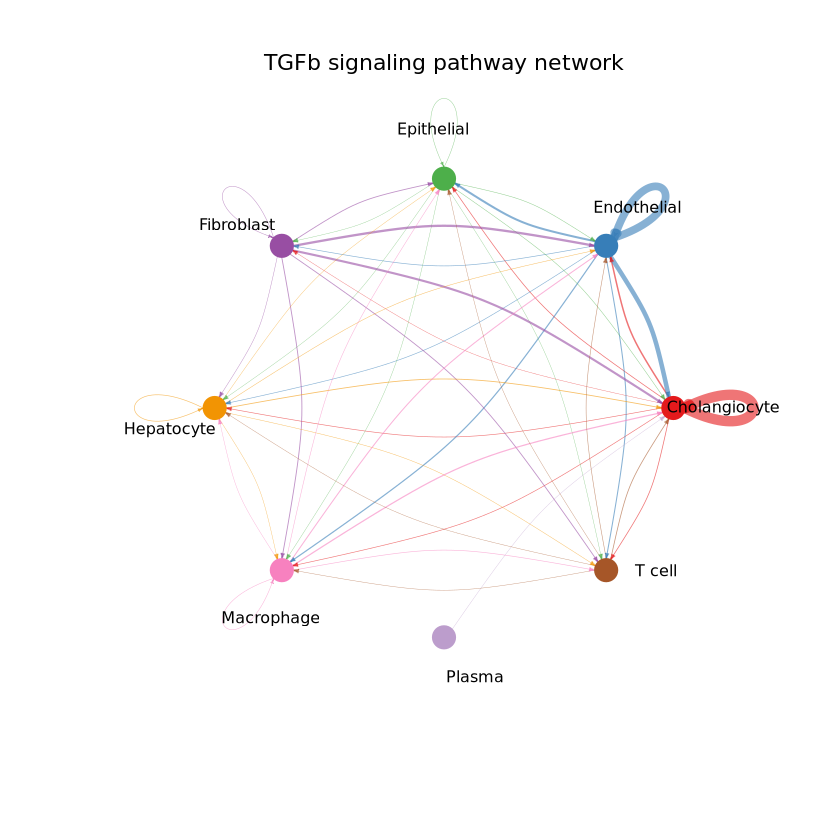

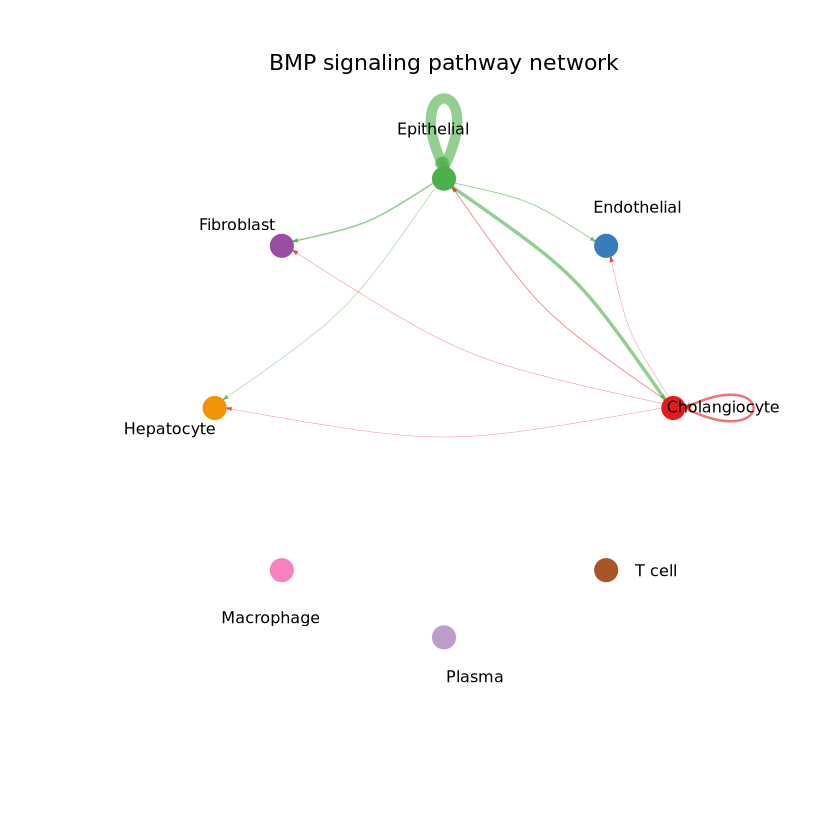

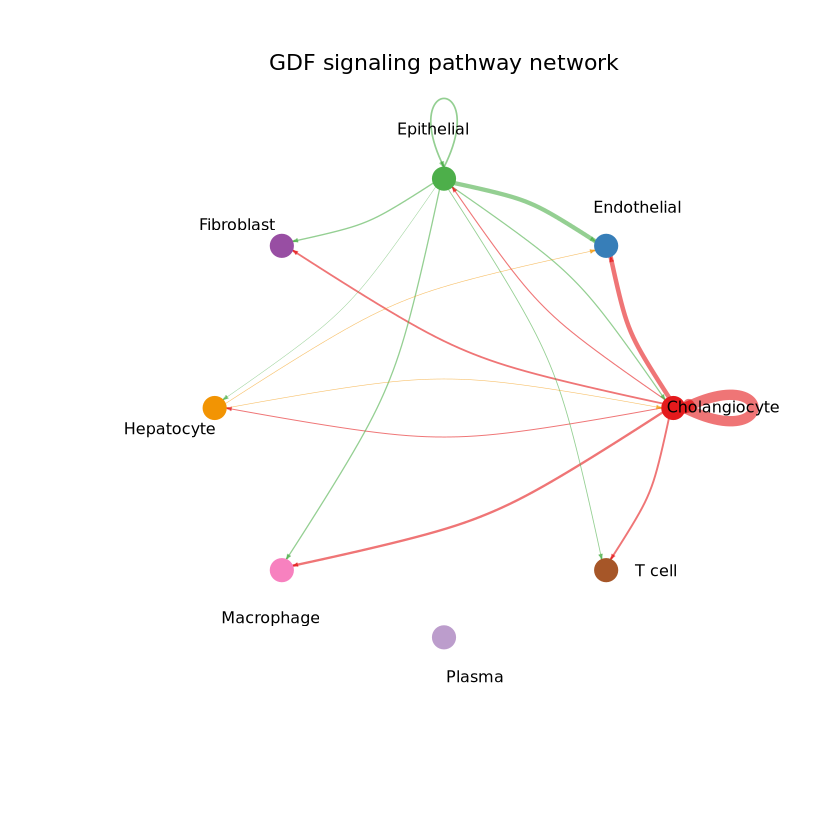

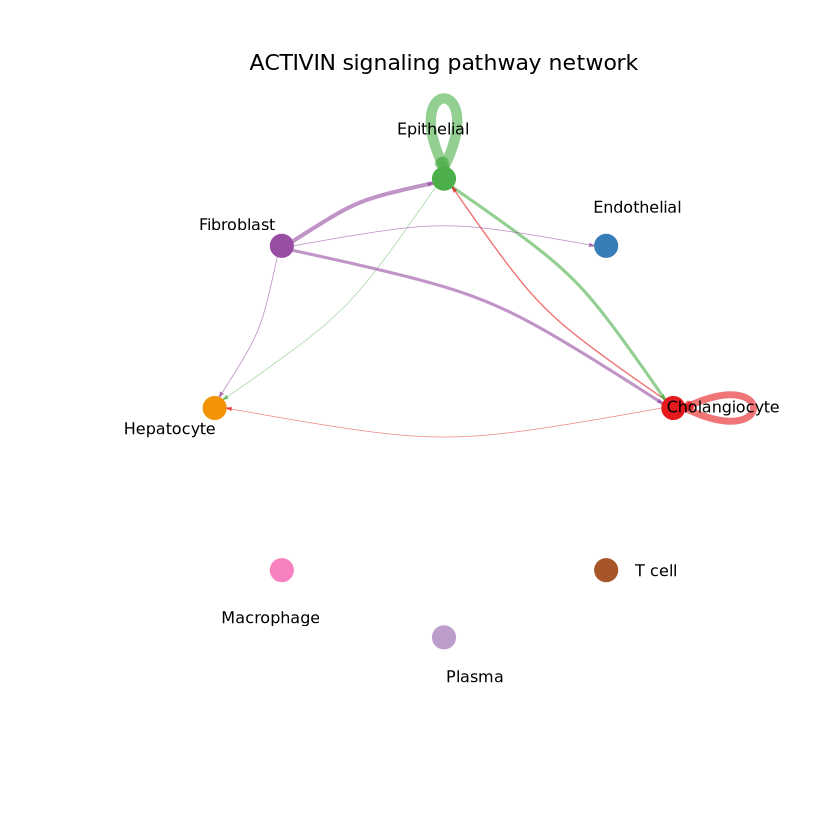

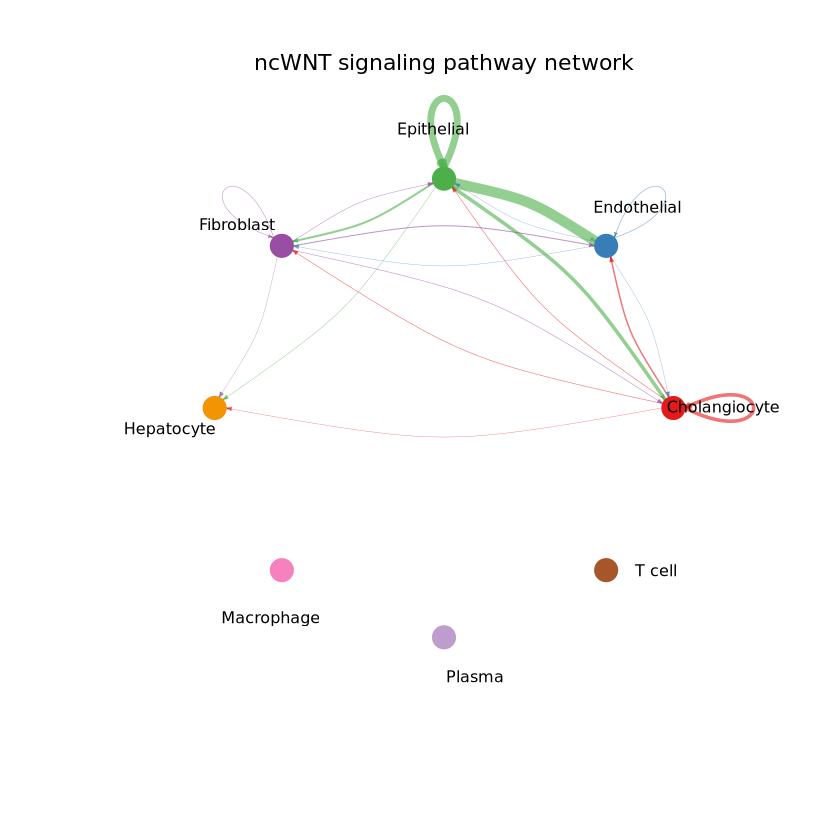

...

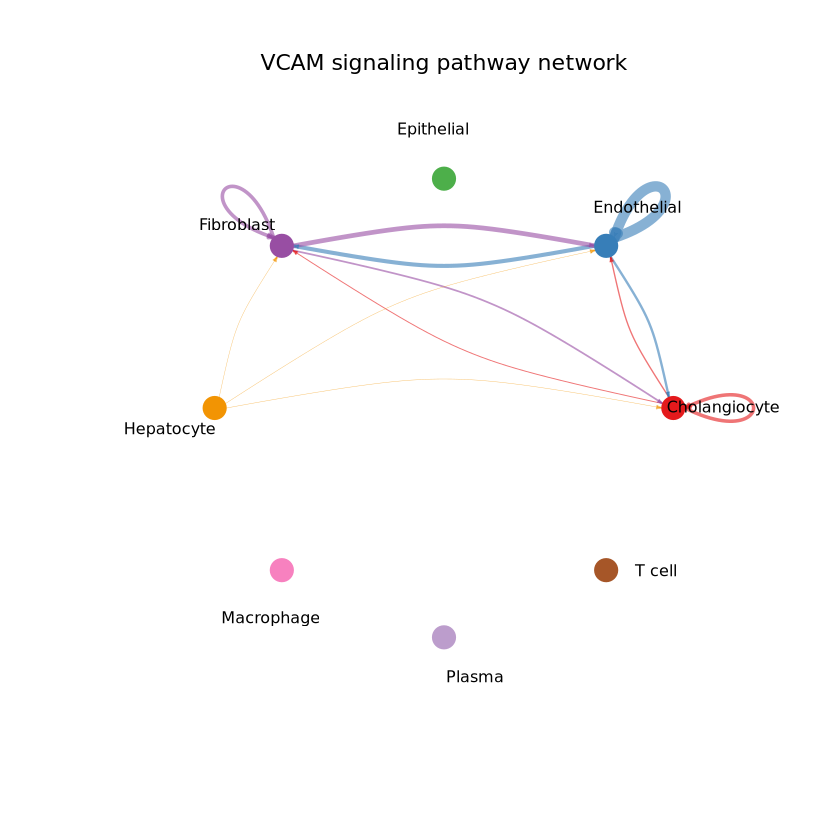

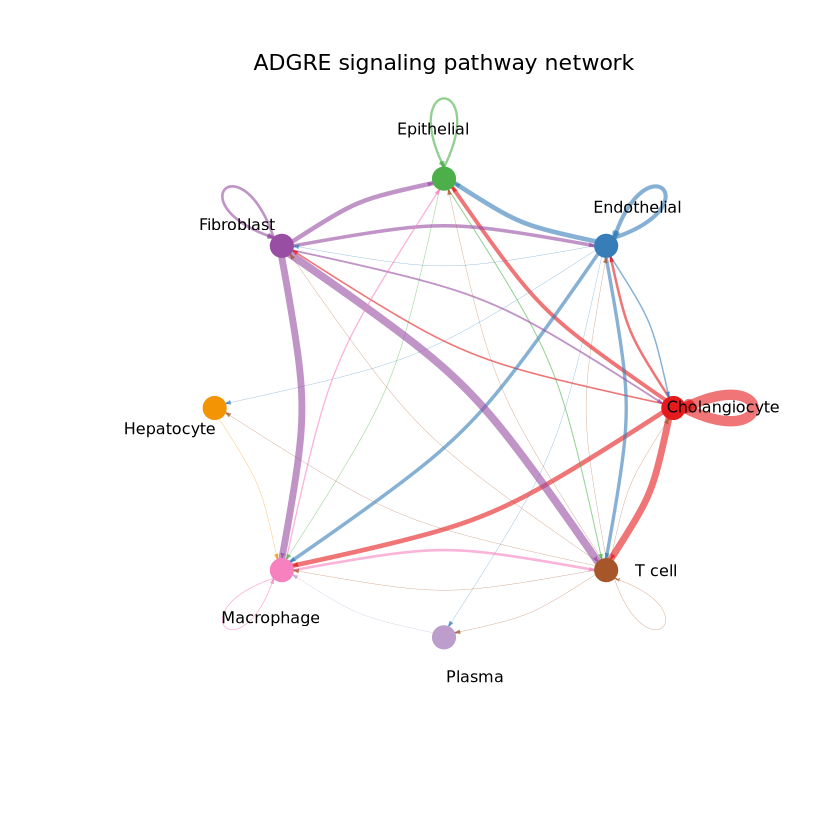

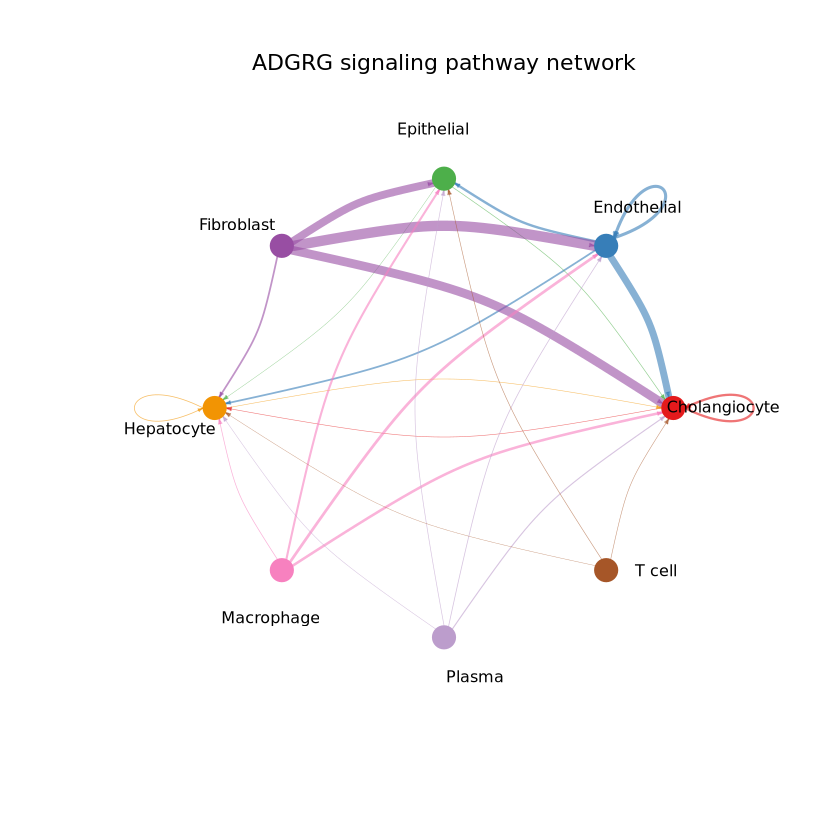

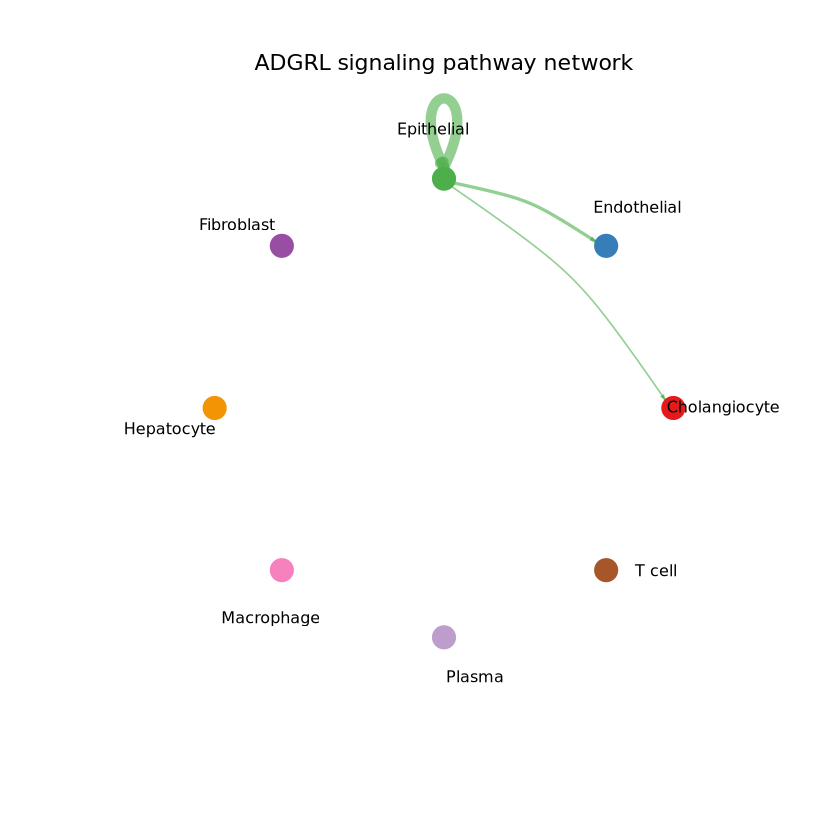

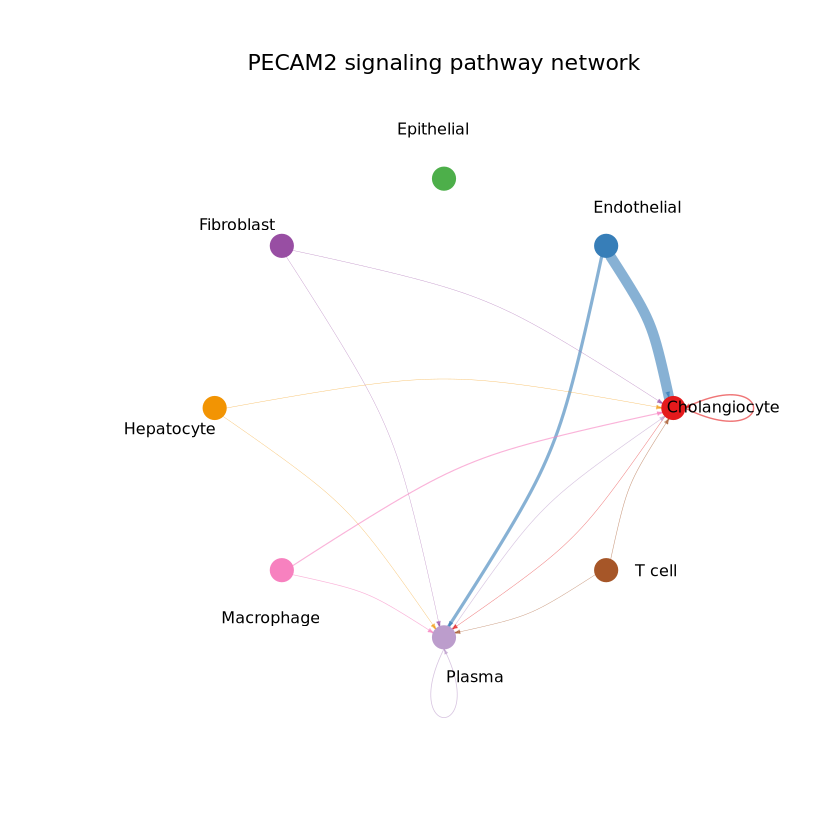

In [20]:
for (pathway in unique(df.net$pathway_name)) {
    par(mfrow=c(1,1), xpd = TRUE) # `xpd = TRUE` should be added to show the title
    netVisual_aggregate(cosmx, signaling = c(pathway), layout = "circle")
}


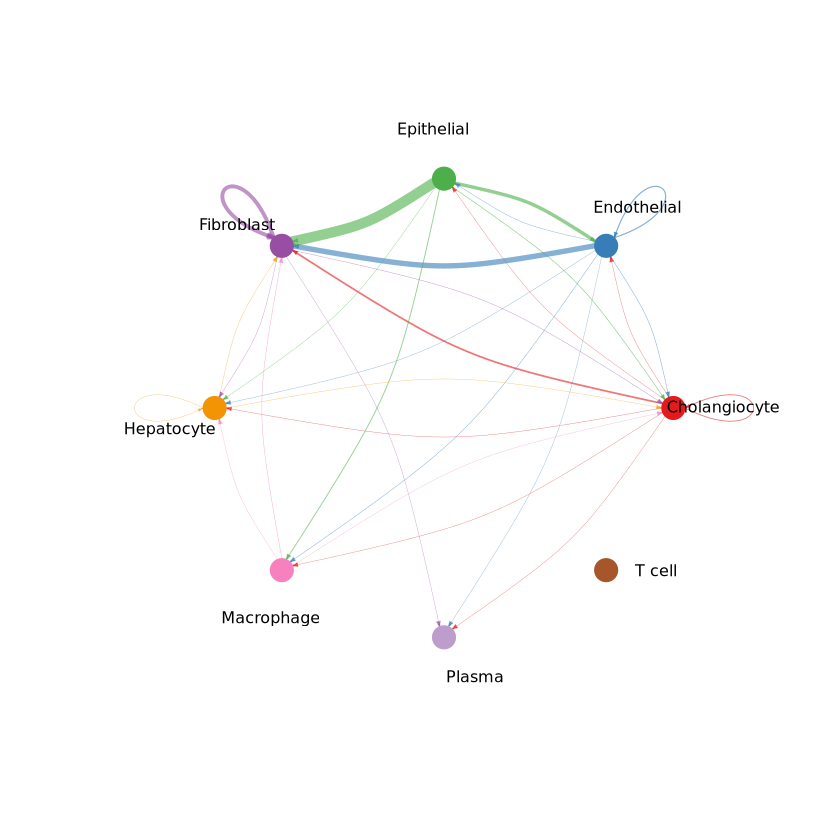

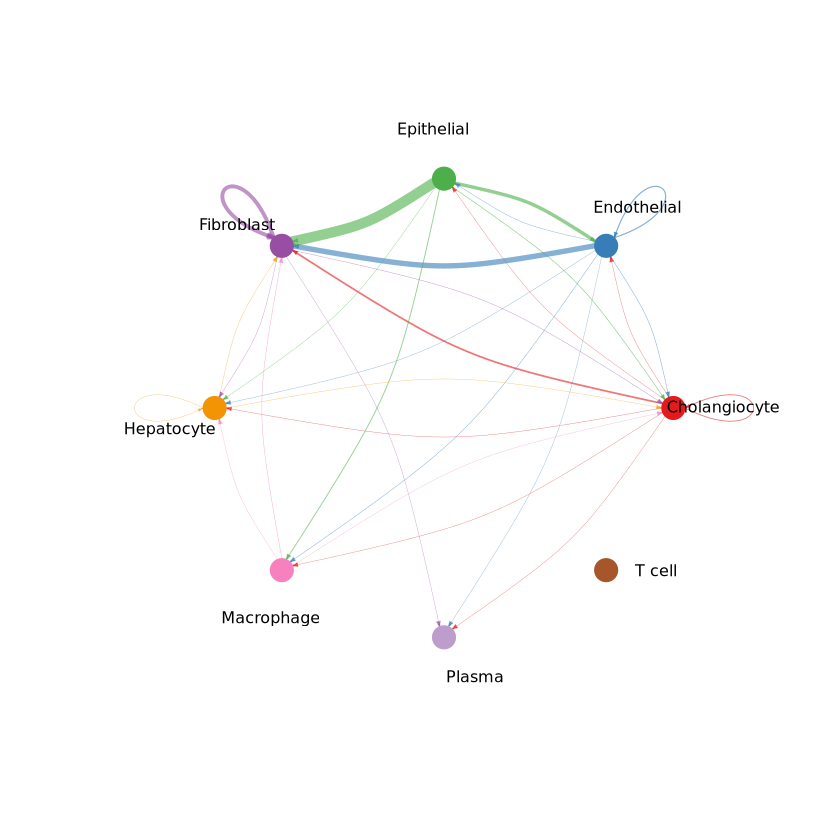

In [139]:
netVisual_aggregate(cosmx, signaling = c("PDGF"), layout = "circle")

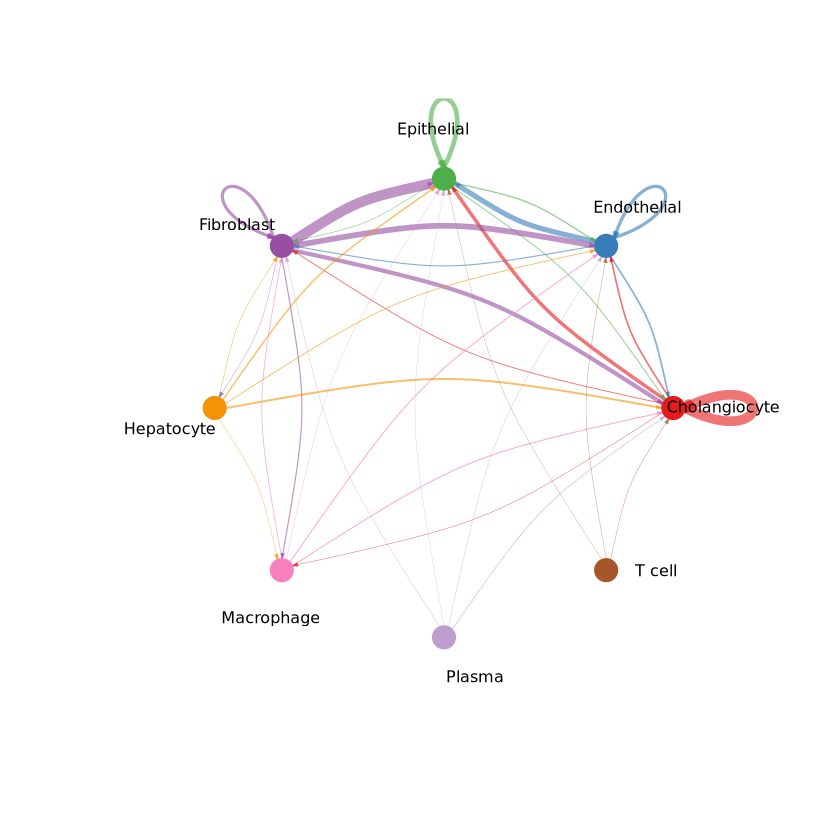

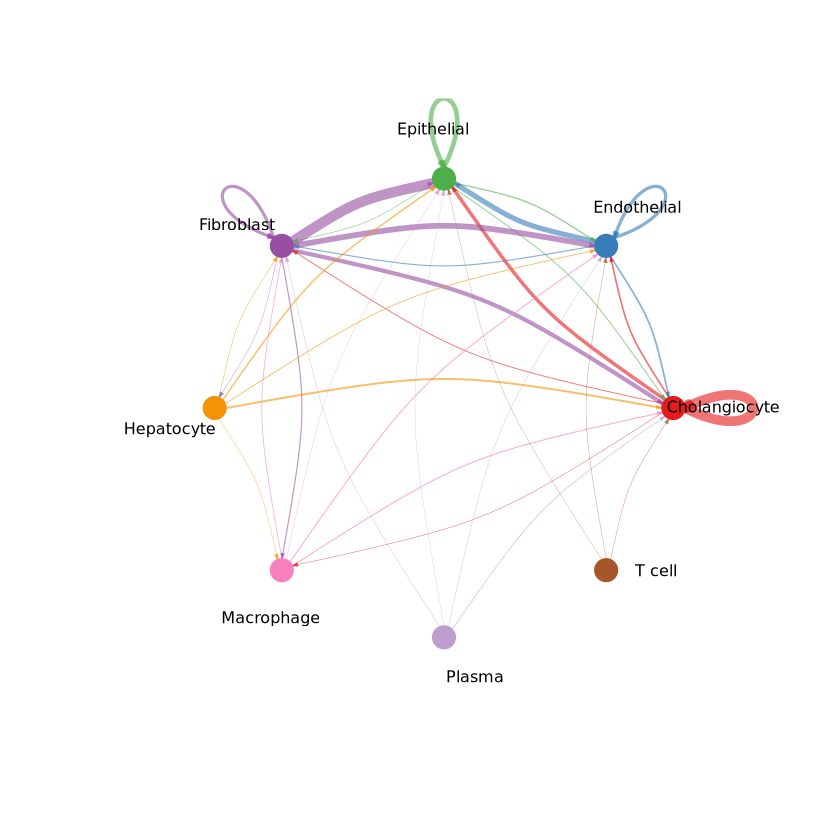

In [140]:
netVisual_aggregate(cosmx, signaling = c("FN1"), layout = "circle")

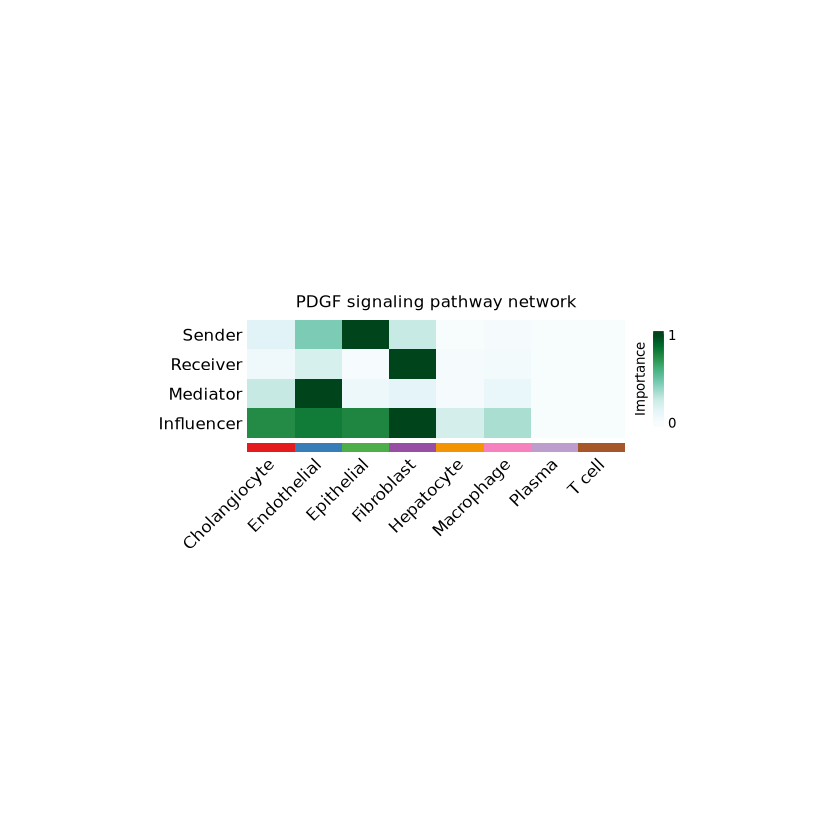

In [143]:
netAnalysis_signalingRole_network(cosmx, signaling = c("PDGF"), width = 8, height = 2.5, font.size = 10)

In [21]:
unique(cosmx@meta$samples)

[1] HT413C1-Th1k4A1-U7  HT413C1-Th1k4A1-U34
Levels: HT413C1-Th1k4A1-U34 HT413C1-Th1k4A1-U7

In [22]:
pdf(file = "/data/estorrs/sandbox/pdgf.pdf")
par(mfrow=c(1,1), xpd = TRUE) # `xpd = TRUE` should be added to show the title
p = netVisual_aggregate(cosmx, signaling = c("PDGF"), layout = "circle")
dev.off()

png 
  2

In [23]:
pdf(file = "/data/estorrs/sandbox/pdgf_heatmap.pdf")
netAnalysis_signalingRole_network(cosmx, signaling = c("PDGF"), width = 8, height = 2.5, font.size = 10)
dev.off()

png 
  2

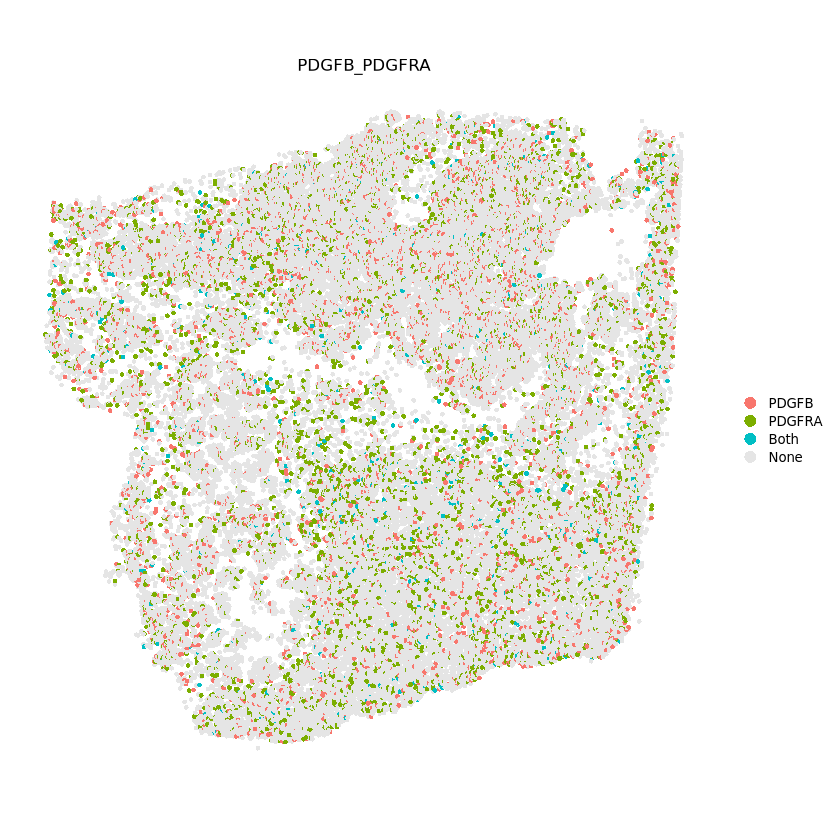

In [24]:
spatialFeaturePlot(cosmx, pairLR.use = "PDGFB_PDGFRA", point.size = 1, do.binary = TRUE, cutoff = 0.05, enriched.only = F, color.heatmap = "Reds", direction = 1, sample.use = "HT413C1-Th1k4A1-U7")


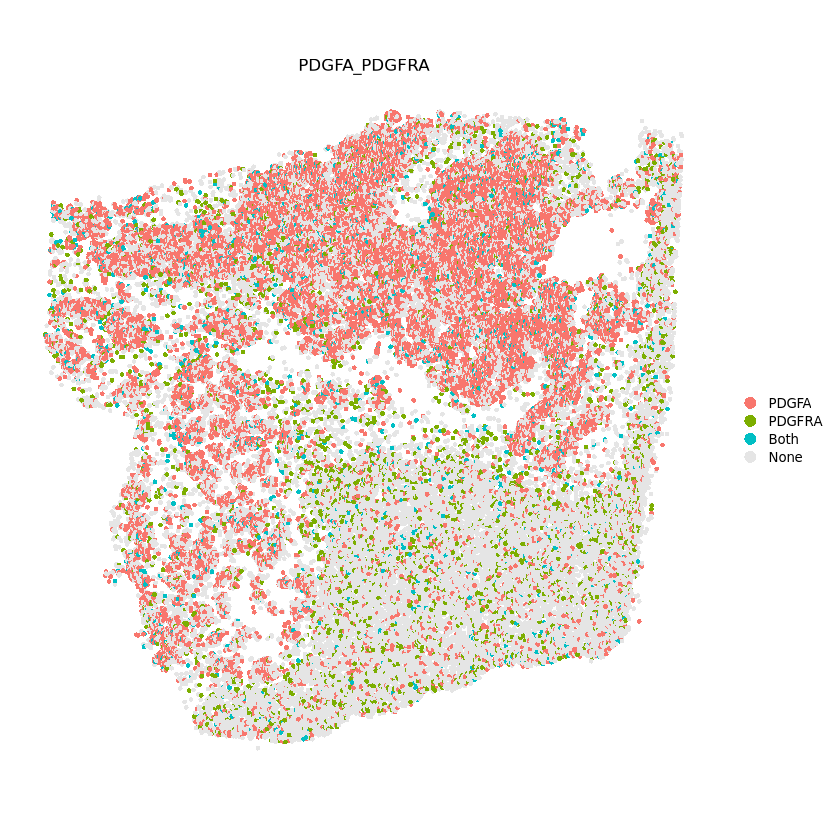

In [25]:
spatialFeaturePlot(cosmx, pairLR.use = "PDGFA_PDGFRA", point.size = 1, do.binary = TRUE, cutoff = 0.05, enriched.only = F, color.heatmap = "Reds", direction = 1, sample.use = "HT413C1-Th1k4A1-U7")


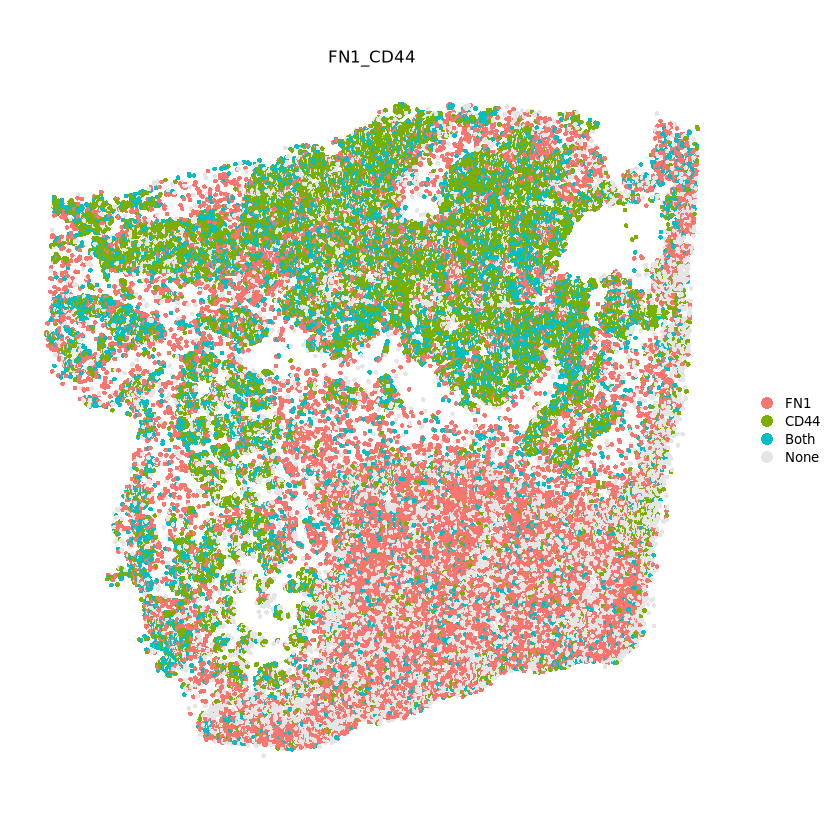

In [35]:
spatialFeaturePlot(cosmx, pairLR.use = "FN1_CD44", point.size = 1, do.binary = TRUE, cutoff = 0.05, enriched.only = F, color.heatmap = "Reds", direction = 1, sample.use = "HT413C1-Th1k4A1-U7")


In [33]:
?spatialFeaturePlot

spatialFeaturePlot {CellChat},R Documentation
object,cellchat object
features,a char vector containing features to visualize. 'features' can be genes or column names of 'object@meta'.
signaling,signalling names to visualize
pairLR.use,"a data frame consisting of one column named ""interaction_name"", defining the L-R pairs of interest"
sample.use,"the sample used for visualization, which should be the element in 'object@meta$samples'."
enriched.only,"whether only return the identified enriched signaling genes in the database. Default = TRUE, returning the significantly enriched signaling interactions"
thresh,threshold of the p-value for determining significant interaction when visualizing links at the level of ligands/receptors;
do.group,set 'do.group = TRUE' when only showing enriched signaling based on cell group-level communication; set 'do.group = FALSE' when only showing enriched signaling based on individual cell-level communication
color.heatmap,"A character string or vector indicating the colormap option to use. It can be the avaibale color palette in brewer.pal() or viridis_pal() (e.g., ""Spectral"",""viridis"")"
"n.colors, direction","n.colors: number of basic colors to generate from color palette; direction: Sets the order of colors in the scale. If 1, the default colors are used. If -1, the order of colors is reversed."


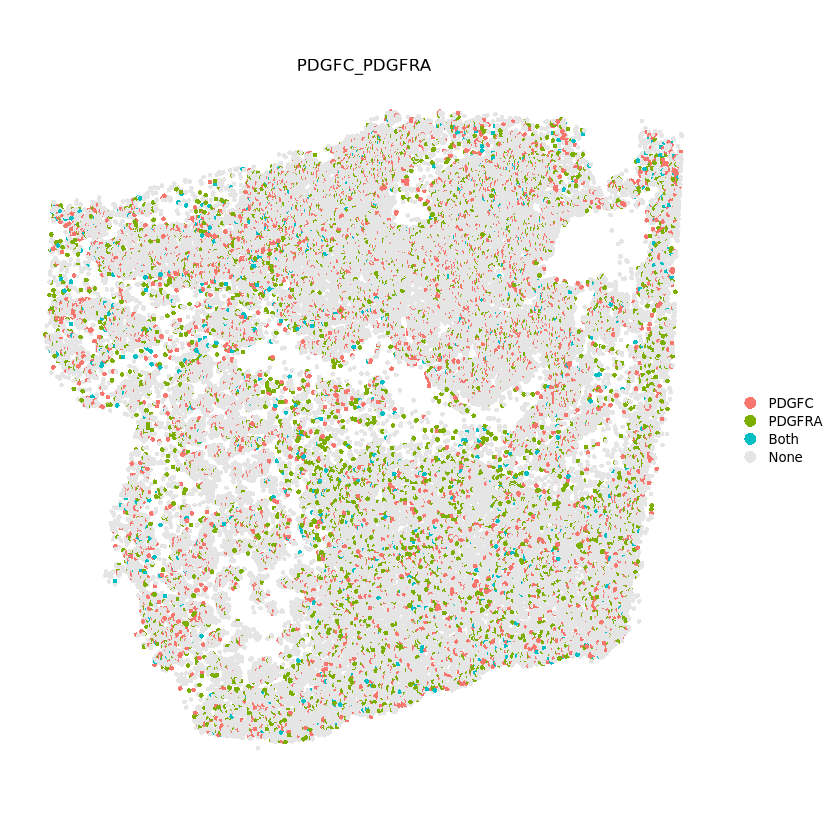

In [26]:
spatialFeaturePlot(cosmx, pairLR.use = "PDGFC_PDGFRA", point.size = 1, do.binary = TRUE, cutoff = 0.05, enriched.only = F, color.heatmap = "Reds", direction = 1, sample.use = "HT413C1-Th1k4A1-U7")


In [129]:
get_called_cells <- function(object, cutoff, pairLR.use, sample.use) {
    thresh = cutoff
    data <- as.matrix(object@data)
    meta <- object@meta
    coords <- object@images$coordinates
    samples <- meta$samples
    
    colnames(coords) <- c("x_cent","y_cent")
    coords = coords[samples == sample.use, ]
    meta = meta[samples == sample.use, ]
    data = data[, samples == sample.use]

    pairLR.use <- data.frame(interaction_name = pairLR.use)
    object@net$prob[object@net$pval > thresh] <- 0
    pairLR.use.name <- pairLR.use$interaction_name[pairLR.use$interaction_name %in% dimnames(object@net$prob)[[3]]]
    prob <- object@net$prob[,,pairLR.use.name, drop = FALSE]
    prob.sum <- apply(prob > 0, 3, sum)
    names(prob.sum) <- pairLR.use.name
    signaling.includes <- names(prob.sum)[prob.sum > 0]
    pairLR.use <- pairLR.use[pairLR.use$interaction_name %in% signaling.includes, , drop = FALSE]
    LR.pair <- object@LR$LRsig[pairLR.use$interaction_name, c("ligand","receptor")]

    geneL <- as.character(LR.pair$ligand)
    geneR <- as.character(LR.pair$receptor)
    # compute the expression of ligand or receptor
    complex_input <- object@DB$complex
    dataL <- computeExpr_LR(geneL, data, complex_input)
    dataR <- computeExpr_LR(geneR, data, complex_input)
    rownames(dataL) <- geneL; rownames(dataR) <- geneR;

    ligand_mask = dataL > cutoff
    receptor_mask = dataR > cutoff
    both = ligand_mask & receptor_mask

    meta$ligand_positive = ligand_mask[1,]
    meta$receptor_positive = receptor_mask[1,]
    meta$both = both[1,]

    return(meta)
}

get_called_cells_all_samples <- function(object, cutoff, pairLR.use) {
    df = NULL
    for (sample.use in unique(object@meta$samples)) {
        data = get_called_cells(object, cutoff, pairLR.use, sample.use)
    
        if (is.null(df)) {
            df = data
        } else {
            df = rbind(df, data)
        }
    }
    return(df)
}

In [144]:
object = cosmx
cutoff = 0.05
pairLR.use = "PDGFC_PDGFRA"
sample.use = 'HT413C1-Th1k4A1-U7'
df = get_called_cells(cosmx, .05, pairLR.use, sample.use)
head(df)

,labels,samples,ligand_positive,receptor_positive,both
,<chr>,<fct>,<lgl>,<lgl>,<lgl>
HT413C1-Th1k4A1-U7_c_1_44_2,Epithelial,HT413C1-Th1k4A1-U7,FALSE,FALSE,FALSE
HT413C1-Th1k4A1-U7_c_1_44_3,Epithelial,HT413C1-Th1k4A1-U7,FALSE,FALSE,FALSE
HT413C1-Th1k4A1-U7_c_1_44_4,Epithelial,HT413C1-Th1k4A1-U7,FALSE,FALSE,FALSE
HT413C1-Th1k4A1-U7_c_1_44_6,Cholangiocyte,HT413C1-Th1k4A1-U7,FALSE,FALSE,FALSE
HT413C1-Th1k4A1-U7_c_1_44_7,Epithelial,HT413C1-Th1k4A1-U7,FALSE,FALSE,FALSE
HT413C1-Th1k4A1-U7_c_1_44_9,Epithelial,HT413C1-Th1k4A1-U7,FALSE,FALSE,FALSE


In [135]:
paste("/data/estorrs/mushroom/data/projects/submission_v1/HT413C1-Th1k4A1/cellchat_xenium/", pairLR.use, "_cells.txt", sep = '')

[1] "/data/estorrs/mushroom/data/projects/submission_v1/HT413C1-Th1k4A1/cellchat_xenium/FN1_CD44_cells.txt"

In [136]:
cutoff = 0.05
pairLR.use = "FN1_CD44"

df = get_called_cells_all_samples(xenium, .05, pairLR.use)
fp = paste("/data/estorrs/mushroom/data/projects/submission_v1/HT413C1-Th1k4A1/cellchat_xenium/", pairLR.use, "_cells.txt", sep = '')
write.table(df, file = fp, sep = "\t", quote = F)

In [ ]:
cutoff = 0.05
pairLR.use = "FN1_CD44"

df = get_called_cells_all_samples(xenium, .05, pairLR.use)
fp = paste("/data/estorrs/mushroom/data/projects/submission_v1/HT413C1-Th1k4A1/cellchat_xenium/", pairLR.use, "_cells.txt", sep = '')
write.table(df, file = fp, sep = "\t", quote = F)